<a href="https://colab.research.google.com/github/cleo-guerra/Curso-Python-Essentials-C6/blob/main/Proyecto_Topicos5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**DESARROLLO DE UN MODELO DE CONTROL DE BIAS DE UN SISTEMA DE RECOMENDACIÓN BASADO EN DATOS DE TWITTER**




1. Lectura de los datos

In [ ]:
import json
with open('drive/MyDrive/DATA/tweets_inCorpusReady.json') as f:
    data = json.load(f)

print('El tamaño de la data es:', len(data),"\n")
print(data[0:50])

El tamaño de la data es: 319889 

[['Azuay', 'miabuelasabia', 125492611, 793552443330166784, 'El verdadero amor no se conoce por lo que exige, sino por lo que ofrece. \n(Jacinto Benavente)', 'verdadero amor conoce exige sino ofrece jacinto benavente'], ['Azuay', 'e_eddyto', 421495028, 793560915882995712, '#ManCity 2 #Barca 1 buen Partido min 69 #ChampionsLeague', '#mancity 2 #barca 1 buen partido min 69 #championsleague'], ['Azuay', 'javiimadridista', 199823133, 793560897864273925, 'Suerte está teniendo el barsa de no ir perdiendo por mas', 'suerte barsa ir perdiendo'], ['Azuay', 'miabuelasabia', 125492611, 793148785371119616, 'La inteligencia se expresa por el corazón, no por los labios', 'inteligencia expresa corazon labios'], ['Azuay', 'alamsaa', 163254017, 793560844906921986, '@fevillavicencio no se preocupe será candidato y lo ganara, necesitamos destapar esta olla revolucionaria egocéntrica corrupta', '@fevillavicencio preocupe candidato ganara necesitamos destapar olla revolucio

Comando para reiniciar el núcleo despues de la instalación de los paquetes

In [ ]:
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)

{'restart': True, 'status': 'ok'}

Instalación Librerías

*   pip install unidecode
*   pip install nltk
*   pip install stop_words
*   pip install sklearn
*   pip install scipy
*   pip install matplotlib
*   pip install gensim
*   pip install encode
*   pip install word2vec


In [ ]:
pip install unidecode

     |████████████████████████████████| 241 kB 14.1 MB/s 


Uso de word2vec - word embeddings

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

Importar librerías

In [ ]:
from unidecode import unidecode
from nltk.tokenize import TweetTokenizer 
from string import punctuation 
from nltk.corpus import stopwords

Ejmeplo de tokenización dle documento de Twitter

In [ ]:
token = TweetTokenizer()
stop_word = [unidecode(stopW) for stopW in stopwords.words('spanish')]

no_s= list(punctuation)
no_s.extend (['¿', '¡', 'q', 'd', 'x', 'xq', '...', '..'])
stop_word = stop_word + no_s

In [ ]:
tokens=[token.lower() for token in token.tokenize(unidecode('Este es un texto con mucho ruido y tiene palabras en español e ingles... , un ejemplo de como limpiar: "caracteres especiales" @you@tube !!| #ICEDEG2018 #uuu. :(;) CAPITALS?')) 
                      if token.lower() not in stop_word]
print(tokens)

['texto', 'ruido', 'palabras', 'espanol', 'ingles', 'ejemplo', 'limpiar', 'caracteres', 'especiales', '@you', '@tube', '#icedeg2018', '#uuu', ':(', ';)', 'capitals']


In [ ]:
oraciones_no_usadas = ['Oracion 1, NECESITA ser limpiada?',
                 'Hay hashtags aqui #Bueno #Cool #MALO#muy malo. Algunos mencionan aqui: @my_account, @another_account',
                 'Muchas stopwords el, ella, en, hay, mio, aqui, el... ellos']

oraciones_limpias = []
for oraciones_enviadas in oraciones_no_usadas:
    tokens = [token1.lower() for token1 in token.tokenize(unidecode(oraciones_enviadas))
                            if token1.lower() not in stop_word]
    oracion_proc = ' '.join(tokens)
    oraciones_limpias.append(oracion_proc)
print(oraciones_limpias)

['oracion 1 necesita ser limpiada', 'hashtags aqui #bueno #cool #malo #muy malo mencionan aqui @my_account @another_account', 'muchas stopwords aqui']


2. Entrenamiento del modelo con librería **word2vec**

In [ ]:
from gensim.models.word2vec import Word2Vec

In [ ]:
model = Word2Vec('tweetsNOStemmed_corpusReady_word2vec.txt', size=300, window= 25)
print (model.corpus_count)
print(model)
print(model.corpus_total_words)
print(model.wv.vocab)

#guarda el modelo
model.save("word2vec.model")
model.save("model.bin")

40
Word2Vec(vocab=2, size=300, alpha=0.025)
40
{'t': <gensim.models.keyedvectors.Vocab object at 0x7f5ef48c5b10>, 'e': <gensim.models.keyedvectors.Vocab object at 0x7f5ef37ee650>}


In [ ]:
model = Word2Vec.load('model.bin')
print(model)

Word2Vec(vocab=2, size=300, alpha=0.025)


In [ ]:
print(model.vector_size)

300


In [ ]:
words = list(model.wv.vocab)
print(words)

['t', 'e']


In [ ]:
print(model.wv.most_similar('t'))

[('e', -0.00915401428937912)]


In [ ]:
print(model['e'])

[-5.90599200e-04  5.91558870e-04  4.01210331e-04 -3.93308350e-04
 -1.21037115e-03 -1.09156547e-03 -1.43830816e-03 -1.03204290e-03
  1.26621639e-03 -1.04805804e-03 -1.06659124e-03  7.01682235e-04
 -1.06972142e-03 -9.34883370e-04  3.91814938e-05  1.12990550e-04
 -4.42897232e-04 -1.07556116e-03 -1.77541020e-04  1.73791297e-04
  2.38257839e-04 -8.24659888e-04  1.06585026e-03 -7.92906852e-04
 -7.98524939e-04  2.30607373e-04  9.75360628e-04 -9.81688965e-04
 -9.59552708e-04  1.55396934e-03 -9.13366501e-04 -1.81992757e-04
 -8.71003605e-04  5.10880083e-04 -1.30465534e-03 -5.36197738e-04
 -1.50346884e-03 -2.73931364e-04  7.35885638e-04 -9.82937054e-04
  6.82659505e-04  1.54770305e-03 -6.67103814e-05 -1.29424292e-03
  4.23384889e-04 -3.44236527e-04 -9.71406640e-04 -2.33850311e-04
  1.60575809e-03  5.16444736e-04  6.13822718e-04 -1.11315923e-03
  8.53740203e-04  1.19444029e-03 -8.76320351e-04 -1.51991285e-03
 -9.74059571e-04  8.75694444e-04 -5.67391049e-04  1.32362533e-04
  6.07942464e-04 -1.71051

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


Trabajando con **word2vec**

In [ ]:
pip install word2vec

     |████████████████████████████████| 42 kB 590 kB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for word2vec: filename=word2vec-0.11.1-py2.py3-none-any.whl size=156423 sha256=f0a653f7b9f2ef891f3426856d85d664c4440aa00743b4d920197059712b5010
  Stored in directory: /root/.cache/pip/wheels/c9/c0/d4/29d797817e268124a32b6cf8beb8b8fe87b86f099d5a049e61
Successfully built word2vec


In [13]:
import word2vec

In [ ]:
word2vec.word2vec('drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt','tweetsNOStemmed_words2vec3000.bin',size = 300,window=10, verbose=True)

Running command: word2vec -train drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt -output tweetsNOStemmed_words2vec3000.bin -size 300 -window 10 -sample 1e-3 -hs 0 -negative 5 -threads 12 -iter 5 -min-count 5 -alpha 0.025 -debug 2 -binary 0 -cbow 1
Starting training using file drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt
Vocab size: 39216
Words in train file: 2425851
Alpha: 0.000029  Progress: 99.98%  Words/thread/sec: 65.03k  

In [ ]:
model1 = word2vec.load('drive/MyDrive/DATA/tweetsNOStemmed_words2vec300.bin')

In [ ]:
print(model1.vectors.shape)

(39216, 300)


In [ ]:
print(model1.vectors.size)

11764800


In [ ]:
model1.vocab

array(['</s>', 'ahora', 'video', ..., '#pensamientos', '@wolffquique',
       'negociada'], dtype='<U78')

In [ ]:
print(model1.similar('correa',n=10,metric='cosine'))

(array([ 569, 2614,  646,  802, 3102,  822, 1073, 2497,  312,  580]), array([0.85483003, 0.84056461, 0.83910341, 0.83564074, 0.83375944,
       0.82909654, 0.82827871, 0.82076085, 0.82045818, 0.82008461]))


In [ ]:
indexes, metrics = model1.similar('correa',n=10,metric='cosine')
model1.generate_response(indexes,metrics).tolist()

[('maduro', 0.8548300269656469),
 ('mashi', 0.8405646080858858),
 ('oposicion', 0.8391034127144901),
 ('lasso', 0.8356407433075596),
 ('corrupto', 0.8337594350651147),
 ('glas', 0.8290965386550337),
 ('fiscal', 0.8282787139071974),
 ('renuncia', 0.8207608532314713),
 ('corrupcion', 0.8204581842927039),
 ('ap', 0.8200846134035649)]

In [ ]:
a, b = model1.similar('maduro',n=10,metric='cosine')
model1.generate_response(a,b).tolist()

[('discurso', 0.8778845818785097),
 ('republica', 0.8732539017043244),
 ('@realdonaldtrump', 0.8705386661199097),
 ('#psuv', 0.8629995737770162),
 ('oposicion', 0.8613887199505295),
 ('eeuu', 0.8569219188187706),
 ('correa', 0.8548300269656469),
 ('renuncia', 0.8522700851680598),
 ('rechazo', 0.8430817502366267),
 ('socialismo', 0.8429473362767007)]

In [ ]:
c, d = model1.similar('lasso',n=10,metric='cosine')
model1.generate_response(c,d).tolist()

[('guillermo', 0.9197942656346573),
 ('moncayo', 0.8737987132866578),
 ('ap', 0.870389438432819),
 ('glas', 0.8683632451688142),
 ('bucaram', 0.8658648385542683),
 ('moreno', 0.8622026177753069),
 ('viteri', 0.860574708135591),
 ('dalo', 0.8571708345511393),
 ('presidencia', 0.857051258613263),
 ('renuncia', 0.8566787721576804)]

In [ ]:
e, f = model1.similar('corrupto',n=10,metric='cosine')
model1.generate_response(e,f).tolist()

[('mud', 0.9303717678098433),
 ('mashi', 0.9292745468293713),
 ('critica', 0.9222019225561198),
 ('corruptos', 0.9217884617353864),
 ('ladrones', 0.9185614898360732),
 ('prepotencia', 0.9179728081524451),
 ('latigo', 0.9159007354514819),
 ('correista', 0.9157367875047737),
 ('golpe', 0.9119369226379268),
 ('bajezas', 0.9104662466932518)]

In [ ]:
model1.vocab[20:30]

array(['bien', 'vamos', 'amor', 'dias', 'quiero', '1', 'jajaja',
       '#ecuador', 'gente', '2'], dtype='<U78')

In [ ]:
model1['correa']

array([-0.00035081,  0.0643862 ,  0.05949782,  0.02377756, -0.01279272,
        0.00228147,  0.05330578, -0.06636646, -0.05414512, -0.08417276,
       -0.08474077, -0.03767091,  0.08650687, -0.01775339,  0.03309112,
       -0.08823157, -0.05368365,  0.0154425 , -0.05051249,  0.02870251,
        0.01056205, -0.00639784, -0.10849407,  0.13197498,  0.02935912,
       -0.08859152,  0.0297659 , -0.04690076, -0.00914174,  0.05077832,
        0.05651504, -0.01563095, -0.04317023, -0.00509524, -0.01140502,
       -0.07908277,  0.05377446, -0.02396692, -0.08173694, -0.08139863,
        0.00764354,  0.04224916, -0.02037309, -0.00175354, -0.03834511,
       -0.05142254, -0.0565353 ,  0.03408882,  0.02974028,  0.05125855,
        0.10510962, -0.00517196,  0.11491361,  0.01385785,  0.05667979,
        0.06837227,  0.00141998, -0.03705621,  0.08472669,  0.01108717,
        0.04517202,  0.04502055, -0.02189997,  0.04672755, -0.06273344,
        0.00376395,  0.03839677, -0.06183898, -0.08194065, -0.00

In [ ]:
indexes, metrics = model1.analogy(pos=['correa', 'venezuela'], neg=['ecuador'], n=10)
model1.generate_response(indexes, metrics).tolist()

[('maduro', 0.4263944639966871),
 ('lasso', 0.40729094607970695),
 ('oposicion', 0.40562774550031205),
 ('reeleccion', 0.40549698672585116),
 ('renuncia', 0.4030518691559173),
 ('corrupto', 0.40084997164549363),
 ('juez', 0.4004735888628087),
 ('dictadura', 0.39849469487197753),
 ('xxi', 0.3967742350370623),
 ('discurso', 0.39527126646092015)]

In [ ]:
indexes, metrics = model1.analogy(pos=['correa', 'maduro'], neg=['ecuador'], n=10)
model1.generate_response(indexes, metrics).tolist()

[('ex', 0.5208846512925246),
 ('jueza', 0.5141534864391024),
 ('juez', 0.5092874420446349),
 ('renuncia', 0.49621524593194294),
 ('fiscal', 0.49475522995341026),
 ('discurso', 0.4865908824131769),
 ('collantes', 0.4835415215213056),
 ('oposicion', 0.4826623279630994),
 ('glas', 0.4817784328927441),
 ('corrupto', 0.48083546958266604)]

In [ ]:
indexes, metrics = model1.analogy(pos=['bucaram', 'lasso'], neg=['venezuela'], n=10) 
model1.generate_response(indexes, metrics).tolist()

[('glas', 0.43513960269696733),
 ('viteri', 0.43303235730628664),
 ('guillermo', 0.4267553275405671),
 ('dalo', 0.42526148636301053),
 ('@carlosverareal', 0.42196948068076257),
 ('@javicontodo', 0.4197655004745995),
 ('cynthia', 0.41730874192323175),
 ('glass', 0.415865901898427),
 ('@ramirogarciaf', 0.4150182686288769),
 ('@caacosta1962', 0.41032814082474933)]

In [ ]:
from scipy import spatial

In [ ]:
s1=float("{0:.3f}".format(1 - spatial.distance.cosine(model1['correa'],model1['maduro'])))
s2=float("{0:.3f}".format(1 - spatial.distance.cosine(model1['correa'],model1['lasso'])))
s3=float("{0:.3f}".format(1 - spatial.distance.cosine(model1['maduro'],model1['shakira'])))
s4=float("{0:.3f}".format(1 - spatial.distance.cosine(model1['corrupcion'],model1['maduro'])))
s5=float("{0:.3f}".format(1 - spatial.distance.cosine(model1['bancario'],model1['lasso'])))
s6=float("{0:.3f}".format(1 - spatial.distance.cosine(model1['correa'],model1['aprobacion'])))

print('Similitud entre "correa" y "maduro":' + str(s1))
print('Similitud entre "correa" y "lasso":' + str(s2))
print('Similitud entre "maduro" y "shakira":' + str(s3))
print('Similitud entre "corrupcion" y "maduro":' + str(s4))
print('Similitud entre "bancario" y "lasso":' + str(s5))
print('Similitud entre "correa" y "aprobacion":' + str(s6))

Similitud entre "correa" y "maduro":0.855
Similitud entre "correa" y "lasso":0.836
Similitud entre "maduro" y "shakira":0.221
Similitud entre "corrupcion" y "maduro":0.723
Similitud entre "bancario" y "lasso":0.393
Similitud entre "correa" y "aprobacion":0.575


Creación de **Clusters** con word2vec

In [ ]:
word2vec.word2clusters('drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt', 'tweetsNOStemmed_clusters5.txt', 5, verbose=True)

Running command: word2vec -train drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt -output tweetsNOStemmed_clusters55.txt -size 100 -window 5 -sample 1e-3 -hs 0 -negative 5 -threads 12 -iter 5 -min-count 5 -alpha 0.025 -debug 2 -binary 0 -cbow 1 -classes 5
Starting training using file drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt
Vocab size: 39216
Words in train file: 2425851
Alpha: 0.000025  Progress: 99.98%  Words/thread/sec: 168.63k  

In [ ]:
clusters = word2vec.load_clusters('drive/MyDrive/DATA/tweetsNOStemmed_clusters5.txt')

In [ ]:
print(clusters.get_words_on_cluster(0).shape)
print(clusters.get_words_on_cluster(1).shape)
print(clusters.get_words_on_cluster(2).shape)
print(clusters.get_words_on_cluster(3).shape)
print(clusters.get_words_on_cluster(4).shape)

(5661,)
(8304,)
(2326,)
(13884,)
(5710,)


In [ ]:
clusters.get_words_on_cluster(0)[:50]

array(['ahora', 'dia', 'gracias', 'asi', 'vida', 'solo', 'mp3', 'mejor',
       'siempre', 'bien', 'amor', 'dias', 'quiero', 'jajaja', 'mundo',
       'manana', 'ver', 'hace', 'amigos', 'hacer', 'dios', 'nunca', 'va',
       'tan', 'aqui', 'vez', 'feliz', 'tiempo', 'cada', 'sonrisa',
       'jajajaja', 'buen', 'buenos', 'cosas', 'dos', 'tener', 'ano',
       'amo', 'nadie', 'voy', 'alguien', 'bueno', 'foto', 'jaja', 'mismo',
       'casa', 'mal', 'hola', 'noche', 'menos'], dtype='<U98')

In [ ]:
clusters.get_words_on_cluster(1)[:50]

array(['</s>', 'video', '@youtube', 'via', 'emitiendo', '3', '1', '2',
       'gusto', 'nuevo', 'retweeted', 'gustado', '2016', '7', 'saludos',
       'partido', '5', '10', '4', 'vivo', 'lista', '15', 'san', 'primer',
       'gana', 'c', 'saludo', 'minutos', '0', '->', 'vs', 'audio', 'oro',
       'by', '2017', 'diario', 'the', 'proximo', 'tras', 'gol', 'juan',
       'm', 'reproduccion', 'comparte', 'machala', 'i', '@c0nvey',
       'colombia', 'carlos', 'oficial'], dtype='<U98')

In [ ]:
clusters.get_words_on_cluster(2)[:50]

array(['ecuador', 'ser', 'pais', 'anos', 'vamos', 'gente', '@mashirafael',
       'personas', 'puede', 'gran', '):', 'presidente', 'nacional',
       'trabajo', 'dice', 'gobierno', 'pueblo', 'parte', 'familia',
       'momento', 'debe', 'trump', 'podemos', 'favor', 'apoyo', 'equipo',
       '@jorgeglas', 'ley', 'correa', 'poder', 'asamblea', 'proyecto',
       'cambio', 'politica', 'falta', '@lenin', 'mujeres', 'historia',
       'paz', 'seguir', 'educacion', 'campana', 'millones', 'acuerdo',
       'dinero', 'ecuatorianos', 'candidatos', 'pueden', 'violencia',
       '@gabrielaespais'], dtype='<U98')

In [ ]:
clusters.get_words_on_cluster(3)[:50]

array(['saco', 'mujer', 'https://t.co/qvepmdjos5', 'holi', 'pljv',
       'fidel', 'https://t.co/8xu87zzk0v', 'suscribes', 'youtuber',
       'muerte', 'castro', 'mil', 'apuesto', 'alternativa', 'tipo',
       'publique', 'ofrecemos', 'https://t.co/oxazorrdzm', 'meses',
       'cdea', 'personalizada', 'dentro', 'bajo', 'chekea', 'jueza',
       'llama', 'aborto', '9-1-', 'precio', 'podria', 'internet',
       'muertos', 'muerto', 'toma', 'capaz', 'suscribete', 'murio',
       'cuidado', 'edad', 'universo', 'pareja', 'recomienda', '@telcel',
       'checo', 'totalmente', 'https://t.co/nadkqvcb0w', 'prueba',
       'ganes', 'etc', 'naturaleza'], dtype='<U98')

In [ ]:
clusters.get_words_on_cluster(4)[:50]

array(['hoy', 'rt', 'nueva', 'semana', 'noviembre', 'quito', 'cuenca',
       'atencion', 'entrevista', 'facebook', 'ciudad', 'centro', 'radio',
       'guayaquil', 'junto', 'ninos', 'feriado', 'domingo', 'seguridad',
       'primera', 'informacion', 'viernes', 'provincia', 'excelente',
       'sector', 'salud', 'programa', 'sabado', 'fm', 'santa', '6',
       'agua', 'nuevos', 'loja', 'visita', 'discapacidad', 'lunes',
       'canton', '20', 'tres', 'inicio', 'servicio', '25',
       'internacional', '9', '8', 'estudiantes', 'sesion', '12', 'traves'],
      dtype='<U98')

Palabras que se encuentran en un cluster

In [ ]:
print(clusters.get_cluster('correa'))
print(clusters.get_cluster('maduro'))
print(clusters.get_cluster('lasso'))
print(clusters.get_cluster('obama'))

2
2
2
2


In [ ]:
print(clusters.get_cluster('corrupto'))
print(clusters.get_cluster('amor'))
print(clusters.get_cluster('odio'))
print(clusters.get_cluster('obama'))

2
0
0
2


3. **Algoritmo K-NN**

In [15]:
import gensim.models.keyedvectors as word2vec
model = word2vec.KeyedVectors.load_word2vec_format('drive/MyDrive/DATA/tweetsNOStemmed_words2vec300.bin', binary=True)
print(model)

In [ ]:
print(model.vocab)

{'</s>': <gensim.models.keyedvectors.Vocab object at 0x7fb79ae63310>, 'ahora': <gensim.models.keyedvectors.Vocab object at 0x7fb79ae63e90>, 'video': <gensim.models.keyedvectors.Vocab object at 0x7fb798676a10>, 'ecuador': <gensim.models.keyedvectors.Vocab object at 0x7fb798697cd0>, 'hoy': <gensim.models.keyedvectors.Vocab object at 0x7fb798697d50>, '@youtube': <gensim.models.keyedvectors.Vocab object at 0x7fb798697dd0>, 'ser': <gensim.models.keyedvectors.Vocab object at 0x7fb798697f10>, 'dia': <gensim.models.keyedvectors.Vocab object at 0x7fb798697f90>, 'gracias': <gensim.models.keyedvectors.Vocab object at 0x7fb798697fd0>, 'via': <gensim.models.keyedvectors.Vocab object at 0x7fb798697e90>, 'emitiendo': <gensim.models.keyedvectors.Vocab object at 0x7fb79ae690d0>, 'asi': <gensim.models.keyedvectors.Vocab object at 0x7fb79869f050>, 'vida': <gensim.models.keyedvectors.Vocab object at 0x7fb79869f0d0>, 'solo': <gensim.models.keyedvectors.Vocab object at 0x7fb79869f150>, 'mp3': <gensim.models

In [ ]:
print(model.wv.most_similar('correa'))

[('maduro', 0.8548300266265869), ('mashi', 0.8405646681785583), ('oposicion', 0.8391034603118896), ('lasso', 0.8356407880783081), ('corrupto', 0.8337595462799072), ('glas', 0.8290966153144836), ('fiscal', 0.8282787799835205), ('renuncia', 0.8207608461380005), ('corrupcion', 0.8204582333564758), ('ap', 0.8200845718383789)]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  """Entry point for launching an IPython kernel.


In [ ]:
print(model.wv.most_similar('maduro'))

[('discurso', 0.877884566783905), ('republica', 0.8732539415359497), ('@realdonaldtrump', 0.8705387115478516), ('#psuv', 0.8629994988441467), ('oposicion', 0.8613887429237366), ('eeuu', 0.8569218516349792), ('correa', 0.8548299670219421), ('renuncia', 0.8522700071334839), ('rechazo', 0.8430817723274231), ('socialismo', 0.842947244644165)]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  """Entry point for launching an IPython kernel.


Defino X

In [16]:
X = model[model.vocab]

In [ ]:
print(X)

[[ 1.3342286e-03  1.4731344e-03 -1.2767537e-03 ... -4.3726602e-04
  -5.5206299e-04  1.0236105e-03]
 [ 5.6130922e-01  9.7001016e-01  4.8190394e-01 ... -6.4379930e-01
   8.9283638e-02 -4.0967581e-01]
 [ 2.3323032e-01 -1.6982131e-01  5.6323725e-01 ...  2.2721124e+00
  -2.1711178e-02  1.4383662e+00]
 ...
 [ 3.4528185e-02 -4.8754723e-03 -8.4011434e-03 ...  2.8384009e-03
  -1.1155000e-03  3.4244742e-02]
 [ 2.7570706e-02 -9.5042791e-03  2.2886363e-03 ...  2.7795369e-02
   2.6844207e-02  2.9361953e-03]
 [ 6.0597483e-02 -6.8130088e-03  2.4678223e-03 ...  6.8225893e-03
   5.0101564e-03  5.0516862e-02]]


In [ ]:
print (list(model.vocab))

['</s>', 'ahora', 'video', 'ecuador', 'hoy', '@youtube', 'ser', 'dia', 'gracias', 'via', 'emitiendo', 'asi', 'vida', 'solo', 'mp3', 'mejor', 'siempre', 'pais', '3', 'anos', 'bien', 'vamos', 'amor', 'dias', 'quiero', '1', 'jajaja', '#ecuador', 'gente', '2', 'mundo', '@mashirafael', 'manana', 'ver', 'hace', 'gusto', 'amigos', 'rt', 'personas', 'hacer', 'dios', 'puede', 'nunca', 'nuevo', 'gran', '):', 'va', 'presidente', 'tan', 'aqui', 'nacional', 'retweeted', 'nueva', 'vez', 'trabajo', 'feliz', 'gustado', 'tiempo', '2016', 'cada', 'dice', 'semana', 'gobierno', '7', 'sonrisa', 'pueblo', 'noviembre', 'jajajaja', 'buen', 'buenos', 'cosas', 'quito', 'dos', 'tener', 'ano', 'saludos', 'amo', 'nadie', 'partido', 'parte', 'saco', 'voy', 'cuenca', 'alguien', 'bueno', 'foto', 'atencion', 'jaja', 'mismo', 'familia', 'casa', 'mal', 'hola', 'noche', 'momento', 'debe', 'menos', 'corazon', 'verdad', 'toda', 'entrevista', 'facebook', 'da', 'hora', 'trump', 'cuenta', 'podemos', 'ciudad', '#cuenca', 'cent

In [ ]:
print (len(list(model.vocab)))

39216


In [ ]:
from sklearn.decomposition import PCA
from matplotlib import pyplot

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  after removing the cwd from sys.path.


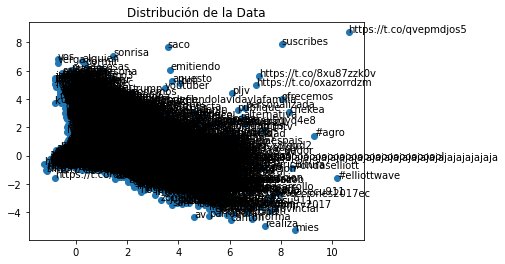

<Figure size 1440x1584 with 0 Axes>

In [ ]:
pca = PCA(n_components=2)
resultado = pca.fit_transform(X)
pyplot.scatter(resultado[:, 0], resultado[:, 1])
palabras = list(model.wv.vocab)
for i, palabra in enumerate(palabras):
	pyplot.annotate(palabra, xy=(resultado[i, 0], resultado[i, 1]))
pyplot.title('Distribución de la Data')
pyplot.figure(figsize=(20,22))
pyplot.show()


Calcular el número de clusters

In [ ]:
from sklearn.cluster import KMeans

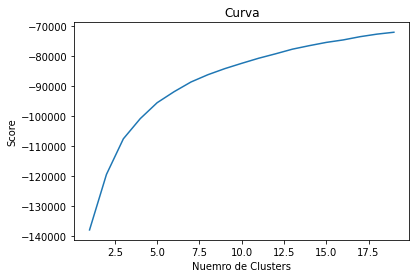

In [ ]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
X = model[model.vocab]
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
pyplot.plot(Nc,score)
pyplot.xlabel('Nuemro de Clusters')
pyplot.ylabel('Score')
pyplot.title('Curva')
pyplot.show()

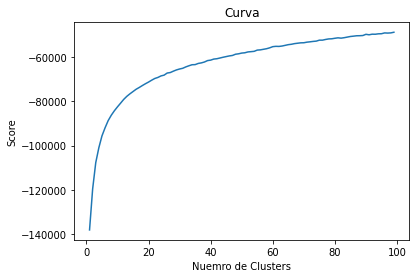

In [ ]:
Nc = range(1, 100)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
X = model[model.vocab]
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
pyplot.plot(Nc,score)
pyplot.xlabel('Nuemro de Clusters')
pyplot.ylabel('Score')
pyplot.title('Curva')
pyplot.show()

In [11]:
import nltk
import sklearn

In [ ]:
numero_clusters=3
kcluster = nltk.cluster.KMeansClusterer(numero_clusters, distance=nltk.cluster.util.cosine_distance, repeats=25)
clusters_asignados = kcluster.cluster(X, assign_clusters=True)
print (clusters_asignados)
 
palabras = list(model.vocab)
for i, palabra in enumerate(palabras):  
    print (palabra + ":" + str(clusters_asignados[i]))
 
kmeans = sklearn.cluster.KMeans(n_clusters=numero_clusters)
kmeans.fit(X) 
 
etiquetas = kmeans.labels_
centroides = kmeans.cluster_centers_
 
print ("Id de la etiqueta del cluster para la data ingresada")
print (etiquetas)
print ("Data de los Centroides")
print (centroides)
 
print ("Score calculada con k-means es la suma de las distancias de los puntos de cada cluster a su centroide:",kmeans.score(X),'\n')

silhouette_score = sklearn.metrics.silhouette_score(X, etiquetas, metric='euclidean')

 
print ("Silhouette_score: ", silhouette_score ,'\n')



Se han truncado las últimas 5000 líneas del flujo de salida.
geografia:1
sole:2
@agroazuay_gpa:2
depar:2
aplique:0
@los_captures:2
state:0
@fifacom:1
dictamen:0
incumplimiento:2
meterme:2
#entrevistaacuerdoue:1
guaman:2
#orgullodelosriobambenos:2
@musicallyapp:2
tkm:0
hospitalaria:0
6.2:0
subdirector:2
bio:2
jazmin:1
guachapala:1
disfrutenlo:1
distincion:2
@chochos:1
derogar:1
@areadeportivafm:0
ei:0
friendzone:2
pinterest:1
#plata:1
kms:2
calladitos:0
creci:0
controversia:0
narrador:0
bilaterales:2
@eloro_aldia:0
demencia:2
acusacion:2
triunfos:1
amables:2
interesada:1
aberrante:0
repuestos:1
notaria:2
easy:1
inv:2
codigos:2
respondieron:0
pued:2
#contalc:2
@gal_04:2
sentira:2
urbanismo:1
acierta:2
dp:0
#unidadpopular:2
basilica:2
@yanrivero_yanet:1
ideologicas:2
expresado:2
@juanorlandoh:2
@supermaxiecu:2
pastores:2
emitido:2
verbo:1
cholas:2
culta:2
@riobambafiestas:1
bloquean:0
@esmilecuador:1
level.ec:1
suministro:1
@paulmorenoo:1
@zavala_ra:2
indiscutible:0
refuerzan:2
@planetama

IndexError: ignored

Para un número de cluster mayor

In [ ]:
numero_clusters=6
kcluster = KMeansClusterer(numero_clusters, distance=nltk.cluster.util.cosine_distance, repeats=25)
clusters_asignados = kcluster.cluster(X, assign_clusters=True)
print (clusters_asignados)
 
palabras = list(model.vocab)
for i, palabra in enumerate(palabras):  
    print (palabra + ":" + str(clusters_asignados[i]))
 
kmeans = cluster.KMeans(n_clusters=numero_clusters)
kmeans.fit(X) 
 
etiquetas = kmeans.labels_
centroides = kmeans.cluster_centers_
 
print ("Id de la etiqueta del cluster para la data ingresada")
print (etiquetas)
print ("Data de los Centroides")
print (centroides)
 
print ("Score calculada con k-means es la suma de las distancias de los puntos de cada cluster a su centroide:",kmeans.score(X),'\n')

silhouette_score = metrics.silhouette_score(X, etiquetas, metric='euclidean')
 
print ("Silhouette_score: ", silhouette_score ,'\n')

Se han truncado las últimas 5000 líneas del flujo de salida.
ap's:4
@andreageanella:2
agasajos:0
distension:5
curuchupa:2
gomii:2
#amistad:4
https://t.co/anxut6veyr:2
movilizarte:3
bebechuy:4
oportunos:3
@concejoquito:3
floricienta:4
@nicoleizurieta2:2
#megaconstruccionesecuatorianas:0
1st:5
austero:4
#socialismo:4
sinteticas:3
unilateralmente:4
@donsanalejo:2
@andresito27p:2
fisicos:4
revoluciona:1
pasale:4
desmontando:4
xlvi:3
@majito_celi:2
#firma:4
135:3
resbalon:4
vealo:2
coelho:4
habilitantes:3
prom:4
torturas:4
basca:0
@chofiagnoletto:4
calvario:4
soleada:4
@michelapinbu:4
sing:5
extranoo:4
@jorge_cse1929:4
oeee:4
vizcaya:5
subastaran:4
pedagogica:3
marchito:4
#atpworldtourfinals:5
walt:4
tratada:4
creeria:4
@mayoralrafa:4
zibechi:5
embarrados:4
despistada:2
liberate:4
castrismo:4
210:4
@orionchronos:4
cometes:2
pragmaticas:1
prog:4
forja:0
#cuandomeenamoro:4
@intendenciase:3
siguencia:5
hvs:4
parlamentarias:1
@pamelitarodas:4
traiciones:4
definida:4
#distrito2:4
buscarse:2
ayud

In [21]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

Automatically created module for IPython interactive environment
Para los clusters:  2 El promedio de silhouette_score es : 0.4303722365192531
Para los clusters:  3 El promedio de silhouette_score es : 0.628188090895389
Para los clusters:  4 El promedio de silhouette_score es : 0.8249350132383944
Para los clusters:  5 El promedio de silhouette_score es : 0.6198662823740743
Para los clusters:  6 El promedio de silhouette_score es : 0.4148488907023434
Para los clusters:  8 El promedio de silhouette_score es : 0.00283356513849364


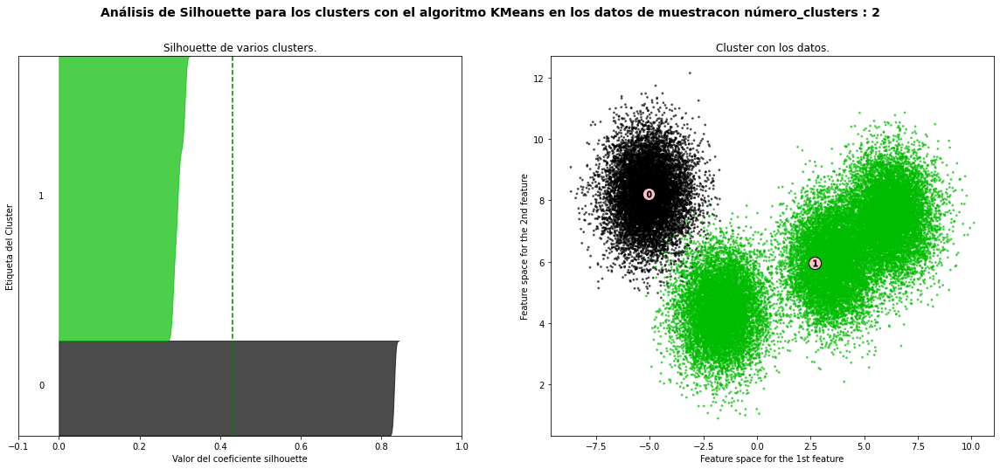

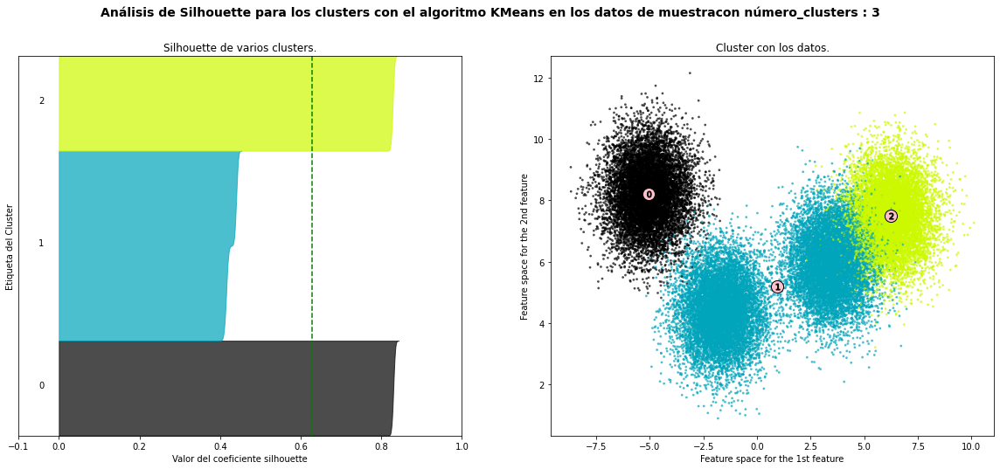

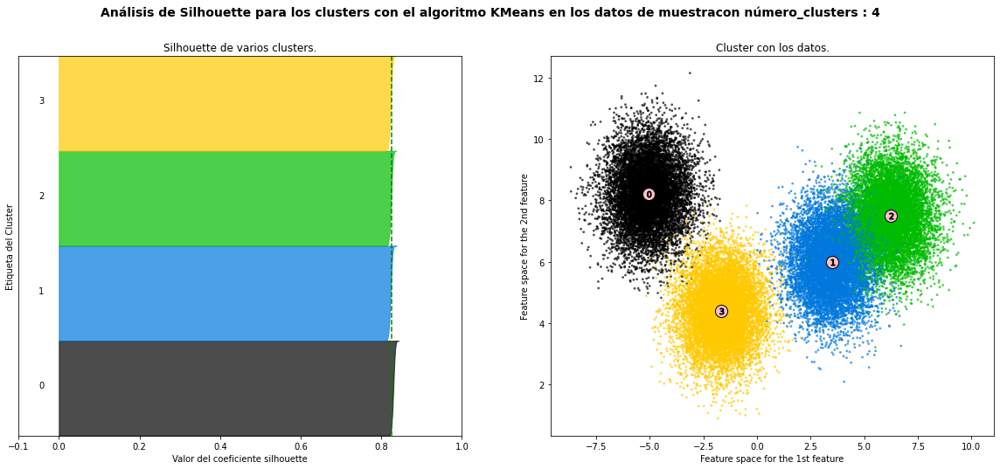

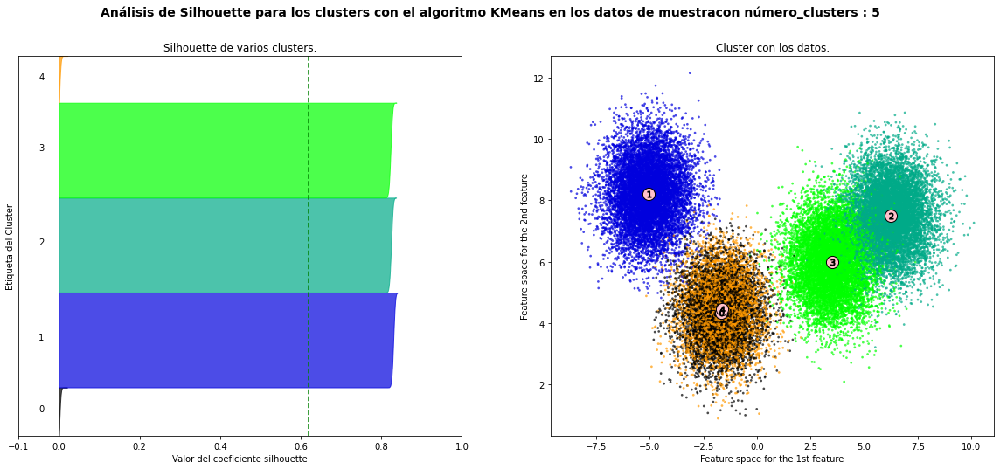

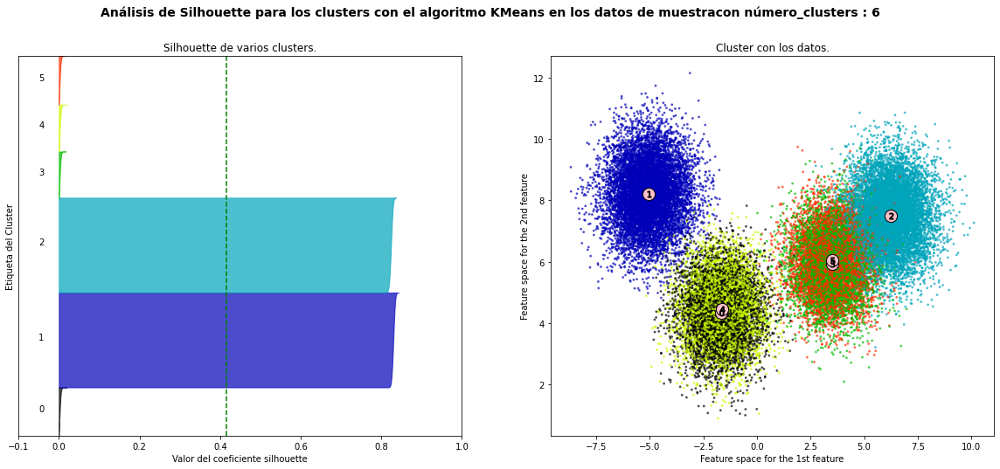

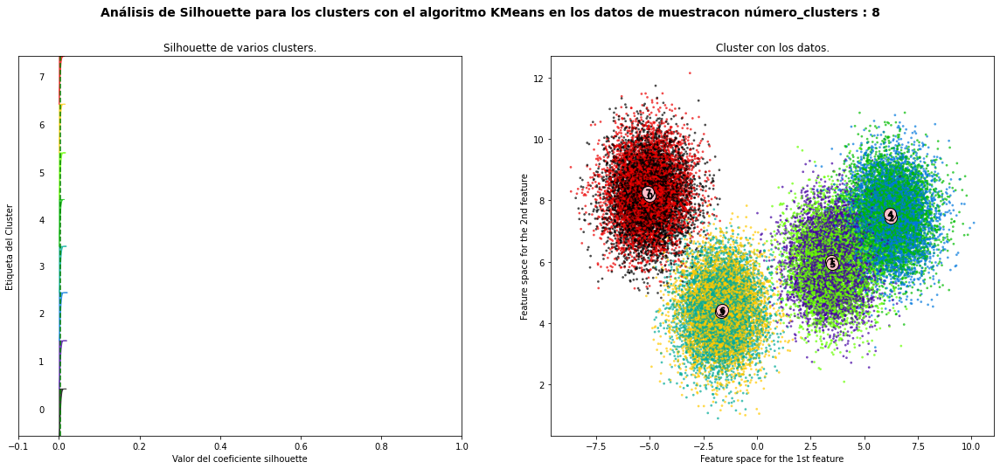

In [ ]:
print(__doc__)

X, y = make_blobs(n_samples=39216,
                  n_features=300,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1) 

rango_clusters = [2, 3, 4, 5, 6, 8]

for n_clusters in rango_clusters:
    fig, (f1, f2) = plt.subplots(1, 2)
    fig.set_size_inches(20, 8)

    # El primero es de silhouette
    f1.set_xlim([-0.1, 1])
    # Se multiplica (n_clusters+1)*10 intersecar los espacio blancos entre silhouette
    f1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # hay un generador random para inicializar los n_clusters con una semilla de 10 para reproducibidad 
    cluster = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = cluster.fit_predict(X)

    # El valor de silhouette_score da el promedio de todas las muestras, da una persectiva de la separacion que se forma en los clusters 
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para los clusters: ", n_clusters,
          "El promedio de silhouette_score es :", silhouette_avg)

    #Se calcula para cada muestra
    valor_sample_silhouette = silhouette_samples(X, cluster_labels)

    y2 = 10
    for i in range(n_clusters):
       #agrega las muestras y se ordenan
        valor_cluster_silhouette = \
            valor_sample_silhouette[cluster_labels == i]
        valor_cluster_silhouette.sort()

        size_cluster = valor_cluster_silhouette.shape[0]
        y3 = y2 + size_cluster

        color = cm.nipy_spectral(float(i) / n_clusters)
        f1.fill_betweenx(np.arange(y2, y3),
                          0, valor_cluster_silhouette,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # etiquetas de silhouette con el numero del cluster en el medio
        f1.text(-0.05, y2 + 0.5 * size_cluster, str(i))

        #se calcula el nuevo valor para y2, con 10 por cada 0 muestras
        y2 = y3 + 10 

    f1.set_title("Silhouette de varios clusters.")
    f1.set_xlabel("Valor del coeficiente silhouette")
    f1.set_ylabel("Etiqueta del Cluster")

    # linea vertical que muesra el promedio de silhouette score con todos los valores
    f1.axvline(x=silhouette_avg, color="green", linestyle="--")

    f1.set_yticks([])  #limpia el eje x
    f1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Segundo grafico muestra los clusters formados
    color = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    f2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=color, edgecolor='k')

    #Etiquetado de los clusters
    centro = cluster.cluster_centers_
    #Dibuja un centro blanco en cada cluster
    f2.scatter(centro[:, 0], centro[:, 1], marker='o',
                c="pink", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centro):
        f2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    f2.set_title("Cluster con los datos.")
    f2.set_xlabel("Feature space for the 1st feature")
    f2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Análisis de Silhouette para los clusters con el algoritmo KMeans en los datos de muestra"
                  "con número_clusters : %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

Automatically created module for IPython interactive environment
Para los clusters:  2 El promedio de silhouette_score es : 0.4303722365192531
Para los clusters:  3 El promedio de silhouette_score es : 0.628188090895389
Para los clusters:  4 El promedio de silhouette_score es : 0.8249350132383944
Para los clusters:  5 El promedio de silhouette_score es : 0.6198662823740743
Para los clusters:  6 El promedio de silhouette_score es : 0.4148488907023434
Para los clusters:  8 El promedio de silhouette_score es : 0.00283356513849364
Para los clusters:  10 El promedio de silhouette_score es : 0.002694224834048887
Para los clusters:  12 El promedio de silhouette_score es : 0.0025297239900970115


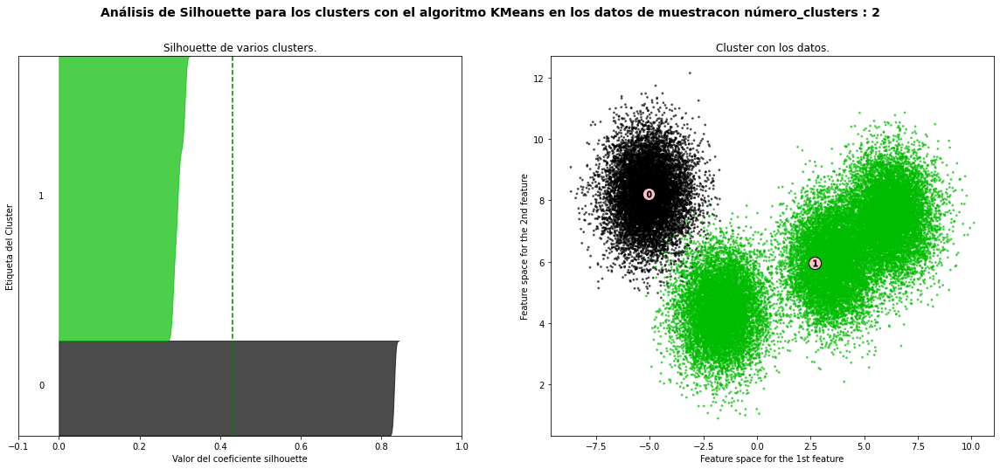

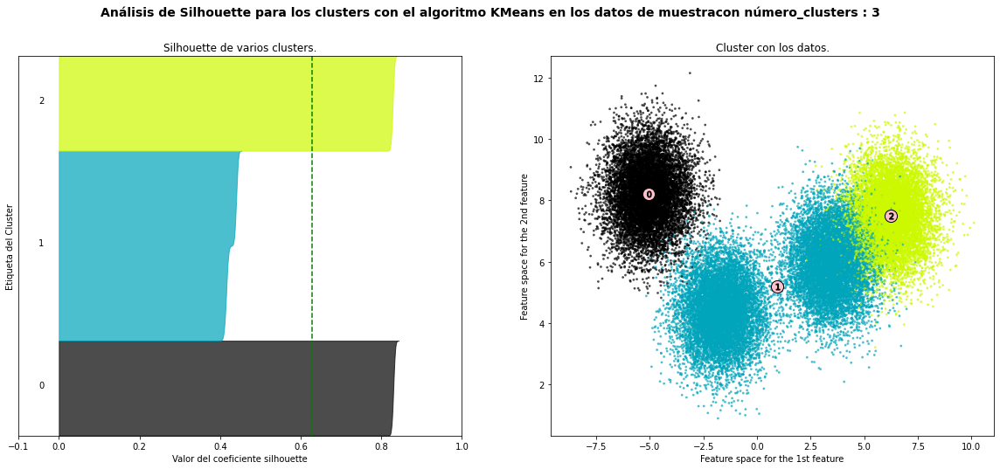

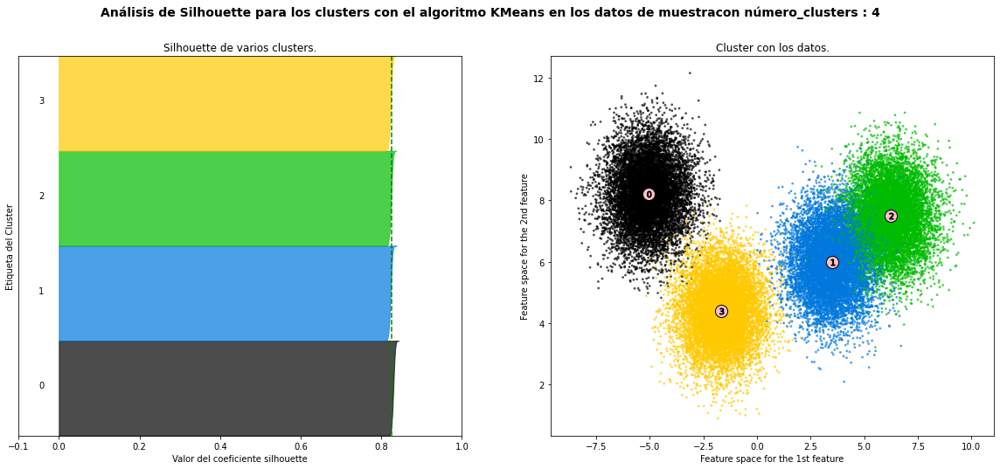

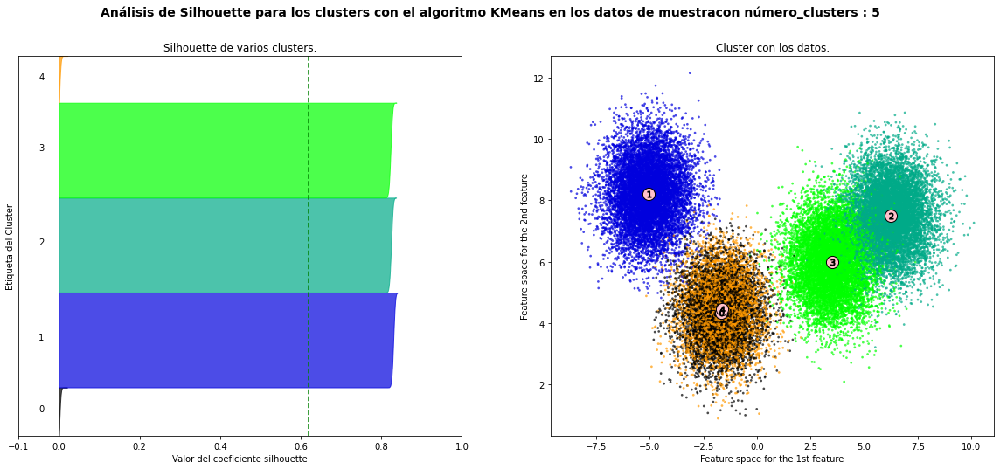

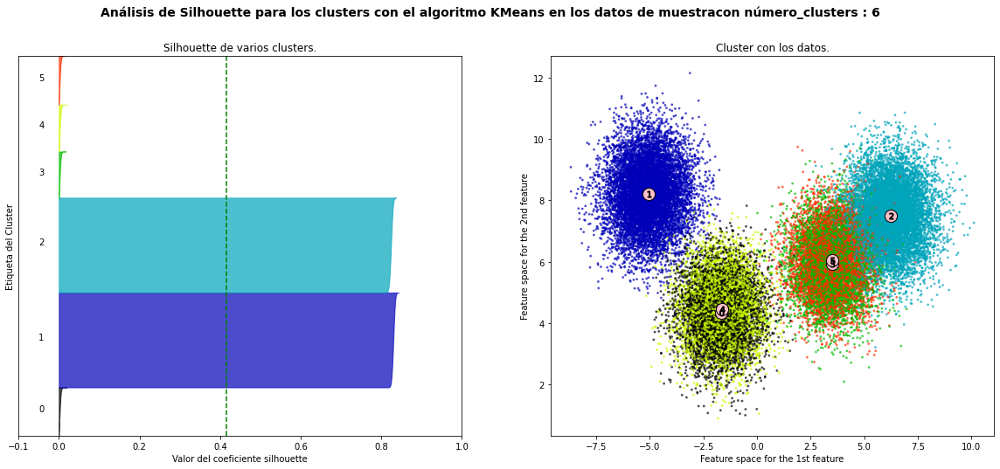

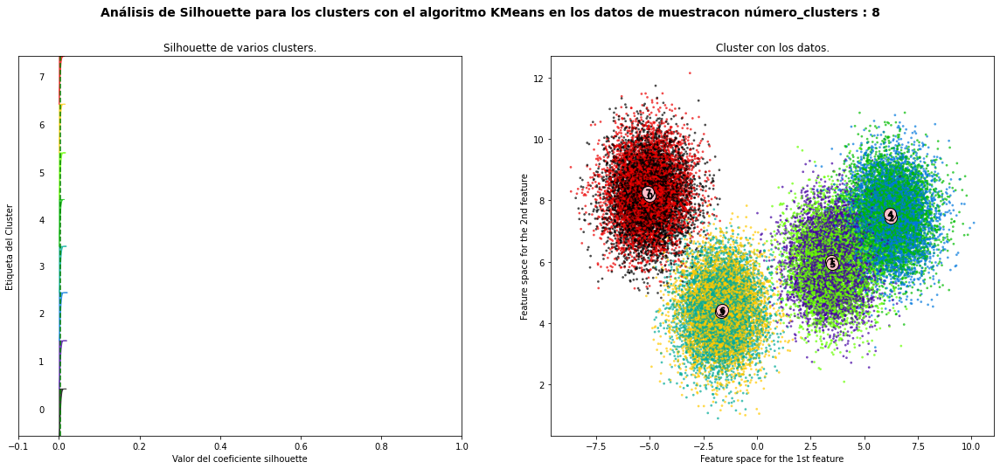

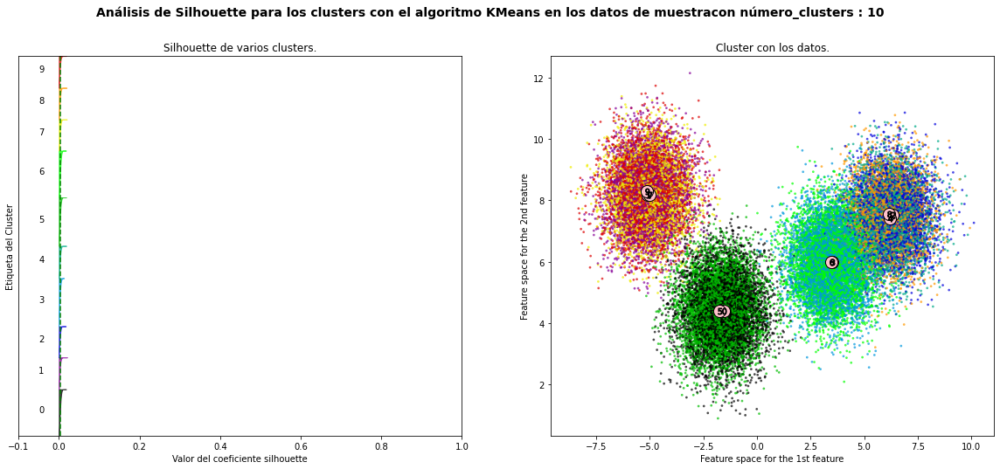

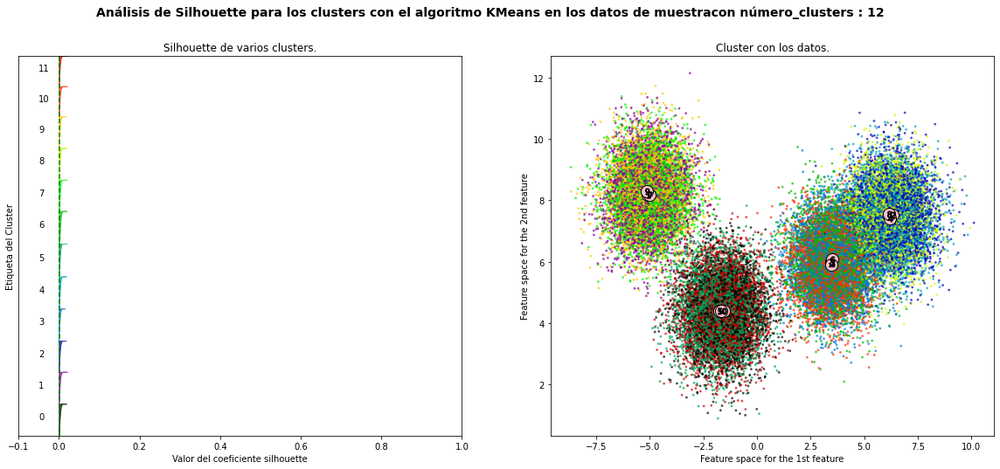

In [ ]:
print(__doc__)

X, y = make_blobs(n_samples=39216,
                  n_features=300,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1) 

rango_clusters = [2, 3, 4, 5, 6, 8, 10, 12]

for n_clusters in rango_clusters:
    fig, (f1, f2) = plt.subplots(1, 2)
    fig.set_size_inches(20, 8)

    # El primero es de silhouette
    f1.set_xlim([-0.1, 1])
    # Se multiplica (n_clusters+1)*10 intersecar los espacio blancos entre silhouette
    f1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # hay un generador random para inicializar los n_clusters con una semilla de 10 para reproducibidad 
    cluster = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = cluster.fit_predict(X)

    # El valor de silhouette_score da el promedio de todas las muestras, da una persectiva de la separacion que se forma en los clusters 
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para los clusters: ", n_clusters,
          "El promedio de silhouette_score es :", silhouette_avg)

    #Se calcula para cada muestra
    valor_sample_silhouette = silhouette_samples(X, cluster_labels)

    y2 = 10
    for i in range(n_clusters):
       #agrega las muestras y se ordenan
        valor_cluster_silhouette = \
            valor_sample_silhouette[cluster_labels == i]
        valor_cluster_silhouette.sort()

        size_cluster = valor_cluster_silhouette.shape[0]
        y3 = y2 + size_cluster

        color = cm.nipy_spectral(float(i) / n_clusters)
        f1.fill_betweenx(np.arange(y2, y3),
                          0, valor_cluster_silhouette,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # etiquetas de silhouette con el numero del cluster en el medio
        f1.text(-0.05, y2 + 0.5 * size_cluster, str(i))

        #se calcula el nuevo valor para y2, con 10 por cada 0 muestras
        y2 = y3 + 10 

    f1.set_title("Silhouette de varios clusters.")
    f1.set_xlabel("Valor del coeficiente silhouette")
    f1.set_ylabel("Etiqueta del Cluster")

    # linea vertical que muesra el promedio de silhouette score con todos los valores
    f1.axvline(x=silhouette_avg, color="green", linestyle="--")

    f1.set_yticks([])  #limpia el eje x
    f1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Segundo grafico muestra los clusters formados
    color = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    f2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=color, edgecolor='k')

    #Etiquetado de los clusters
    centro = cluster.cluster_centers_
    #Dibuja un centro blanco en cada cluster
    f2.scatter(centro[:, 0], centro[:, 1], marker='o',
                c="pink", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centro):
        f2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    f2.set_title("Cluster con los datos.")
    f2.set_xlabel("Feature space for the 1st feature")
    f2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Análisis de Silhouette para los clusters con el algoritmo KMeans en los datos de muestra"
                  "con número_clusters : %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


**Entrenamiento con otra  Data 2**


In [ ]:
word2vec.word2vec('drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_2.txt','words2vec3000.bin',size = 300,window=10, verbose=True)

Running command: word2vec -train drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_2.txt -output words2vec3000.bin -size 300 -window 10 -sample 1e-3 -hs 0 -negative 5 -threads 12 -iter 5 -min-count 5 -alpha 0.025 -debug 2 -binary 0 -cbow 1
Starting training using file drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_2.txt
Vocab size: 39149
Words in train file: 2418790
Alpha: 0.000024  Progress: 99.99%  Words/thread/sec: 68.92k  

In [ ]:
model_2 = word2vec.load('words2vec3000.bin')


In [ ]:
print(model_2.vectors.size)

11744700


In [ ]:
import gensim.models.keyedvectors as word2vec
model_3 = word2vec.KeyedVectors.load_word2vec_format('words2vec3000.bin', binary=True)
print(model_3)

In [ ]:
print(model_3.vectors.shape)

(23145, 300)


In [ ]:
X1 = model_3[model_3.vocab]

In [ ]:
print(X1)

[[6.4094063e-10 1.6689297e-07 6.3369221e-10 ... 2.5638758e-09
  1.5686388e-19 6.4094063e-10]
 [6.4094063e-10 2.6257585e-06 4.0057846e-11 ... 1.5686065e-19
  6.3369293e-10 6.4098327e-10]
 [6.4094063e-10 1.0859265e-05 6.3369221e-10 ... 1.7662052e-04
  6.2982775e-10 2.6077589e-09]
 ...
 [4.1020201e-08 2.6368081e-09 4.0057846e-11 ... 1.0779829e-08
  9.1063155e-12 2.5637625e-09]
 [6.3369293e-10 1.7153877e-07 4.0046386e-11 ... 1.6408080e-07
  1.7153866e-07 4.0057846e-11]
 [1.0255050e-08 1.0860432e-05 6.3369221e-10 ... 4.2244959e-05
  1.5348905e-19 6.4094063e-10]]


In [ ]:
print (list(model_3.vocab))

['</s>', '0294', '0', '980', '44', '466', '', '0.995319', '.402672', '4293', '-0.645910', '1.031552', '63', '98278', '.402599', '337', '619464', '542105', '6', '-2.962168', '4', '400778', '12', '0685', '.034672', '17', '-0.197921', '78', '3699', '46', '33085', '2196', '0.783256', '4957', '85', '5', '267', '.058357', '701411', '81654', '7741', '80', '1724', '01199', '0.591299', '8', '7727', '205', '956', '.142131', '0.742495', '0.648336', '.494036', '-1.082979', '-1.164105', '0.041481', '612', '9', '589191', '0.059975', '08', '2334', '923', '6544', '-0.476354', '.542383', '902', '077651', '002282', '303', '.427461', '0.517868', '-0.365242', '48482', '055215', '699', '34', '63844', '076840', '0.613721', '0.309272', '0.609328', '588792', '015032', '64', '3455', '93651', '067118', '913', '7', '8312', '454727', '74439', '.162304', '.249667', '755', '2', '20546', '8609', '276', '.030922', '0895', '58', '-1.643283', '82702', '4124', '.583542', '323726', '10', '6031', '.863185', '247217', '.31

In [ ]:
print (len(list(model_3.vocab)))

23145


In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

Automatically created module for IPython interactive environment
Para los clusters:  2 El promedio de silhouette_score es : 0.4261006034735346
Para los clusters:  3 El promedio de silhouette_score es : 0.6281242688336492
Para los clusters:  4 El promedio de silhouette_score es : 0.8249567238993857
Para los clusters:  5 El promedio de silhouette_score es : 0.6183227031202476
Para los clusters:  6 El promedio de silhouette_score es : 0.4133192859909723


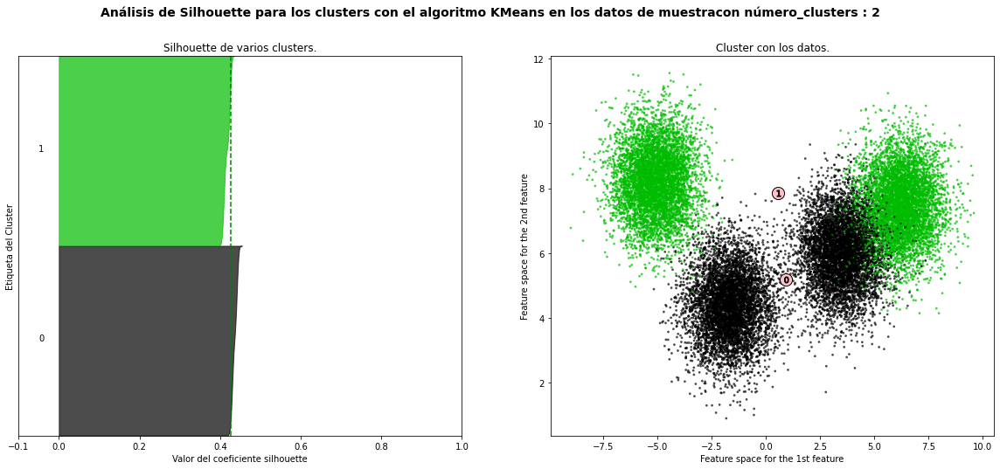

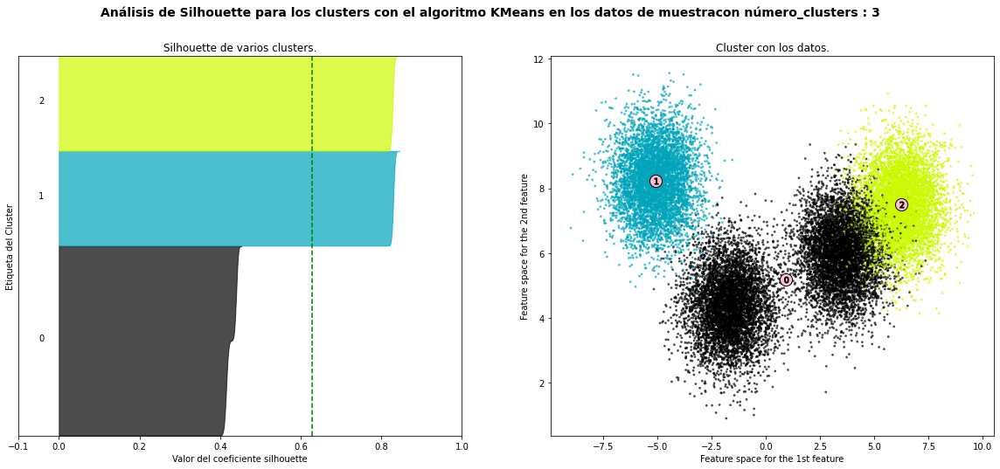

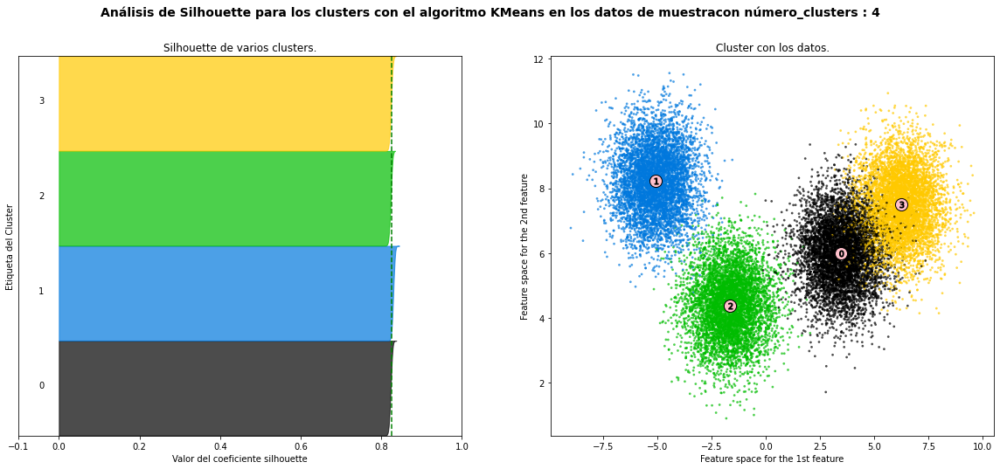

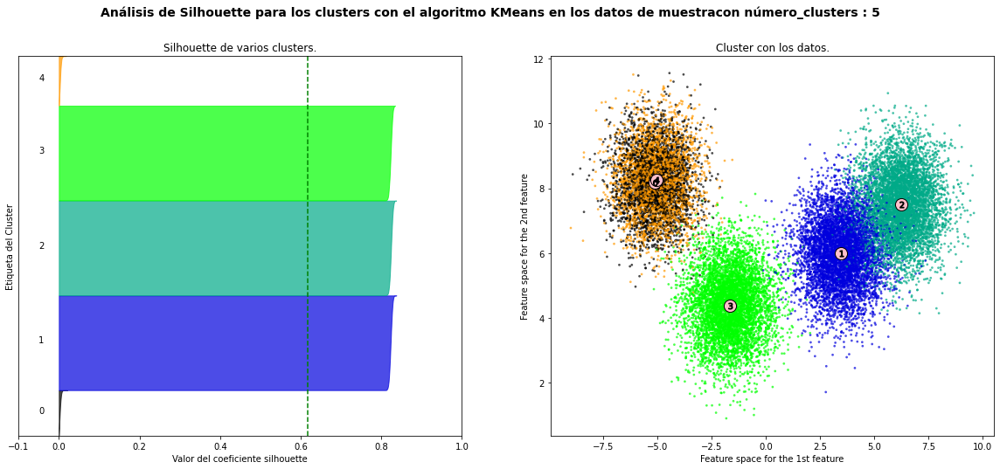

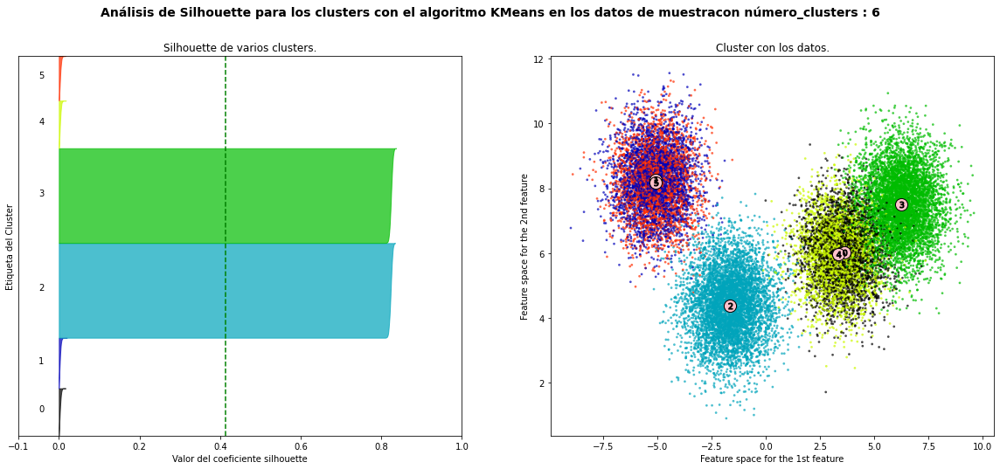

In [ ]:
print(__doc__)

X1, y = make_blobs(n_samples=23145,
                  n_features=300,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1) 

rango_clusters = [2, 3, 4,5,6]

for n_clusters in rango_clusters:
    fig, (f1, f2) = plt.subplots(1, 2)
    fig.set_size_inches(20, 8)

    # El primero es de silhouette
    f1.set_xlim([-0.1, 1])
    # Se multiplica (n_clusters+1)*10 intersecar los espacio blancos entre silhouette
    f1.set_ylim([0, len(X1) + (n_clusters + 1) * 10])

    # hay un generador random para inicializar los n_clusters con una semilla de 10 para reproducibidad 
    cluster = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = cluster.fit_predict(X1)

    # El valor de silhouette_score da el promedio de todas las muestras, da una persectiva de la separacion que se forma en los clusters 
    silhouette_avg = silhouette_score(X1, cluster_labels)
    print("Para los clusters: ", n_clusters,
          "El promedio de silhouette_score es :", silhouette_avg)

    #Se calcula para cada muestra
    valor_sample_silhouette = silhouette_samples(X1, cluster_labels)

    y2 = 10
    for i in range(n_clusters):
       #agrega las muestras y se ordenan
        valor_cluster_silhouette = \
            valor_sample_silhouette[cluster_labels == i]
        valor_cluster_silhouette.sort()

        size_cluster = valor_cluster_silhouette.shape[0]
        y3 = y2 + size_cluster

        color = cm.nipy_spectral(float(i) / n_clusters)
        f1.fill_betweenx(np.arange(y2, y3),
                          0, valor_cluster_silhouette,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # etiquetas de silhouette con el numero del cluster en el medio
        f1.text(-0.05, y2 + 0.5 * size_cluster, str(i))

        #se calcula el nuevo valor para y2, con 10 por cada 0 muestras
        y2 = y3 + 10 

    f1.set_title("Silhouette de varios clusters.")
    f1.set_xlabel("Valor del coeficiente silhouette")
    f1.set_ylabel("Etiqueta del Cluster")

    # linea vertical que muesra el promedio de silhouette score con todos los valores
    f1.axvline(x=silhouette_avg, color="green", linestyle="--")

    f1.set_yticks([])  #limpia el eje x
    f1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Segundo grafico muestra los clusters formados
    color = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    f2.scatter(X1[:, 0], X1[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=color, edgecolor='k')

    #Etiquetado de los clusters
    centro = cluster.cluster_centers_
    #Dibuja un centro blanco en cada cluster
    f2.scatter(centro[:, 0], centro[:, 1], marker='o',
                c="pink", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centro):
        f2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    f2.set_title("Cluster con los datos.")
    f2.set_xlabel("Feature space for the 1st feature")
    f2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Análisis de Silhouette para los clusters con el algoritmo KMeans en los datos de muestra"
                  "con número_clusters : %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  after removing the cwd from sys.path.


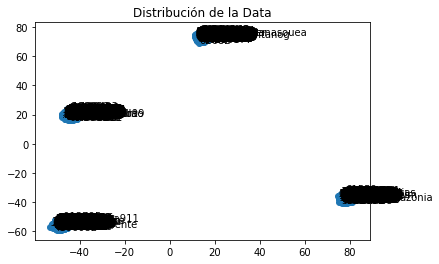

<Figure size 1440x1584 with 0 Axes>

In [ ]:
pca = PCA(n_components=2)
resultado = pca.fit_transform(X)
pyplot.scatter(resultado[:, 0], resultado[:, 1])
palabras = list(model_3.wv.vocab)
for i, palabra in enumerate(palabras):
	pyplot.annotate(palabra, xy=(resultado[i, 0], resultado[i, 1]))
pyplot.title('Distribución de la Data')
pyplot.figure(figsize=(20,22))
pyplot.show()

**Data 3**

In [20]:
word2vec.word2vec('drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_3.txt','words2vec3000_1.bin',size = 300,window=10, verbose=True)

AttributeError: ignored

In [ ]:
model_4 = word2vec.load('words2vec3000_1.bin')

In [3]:
print(model_2.vectors.size)

NameError: ignored

In [ ]:
import gensim.models.keyedvectors as word2vec
model_5 = word2vec.KeyedVectors.load_word2vec_format('words2vec3000_1.bin', binary=True)
print(model_5)

In [ ]:
print(model_5.vectors.shape)

(489, 300)


In [ ]:
X2 = model_5[model_5.vocab]
print(X2)

[[6.4094063e-10 1.6689297e-07 6.3369221e-10 ... 2.5638758e-09
  1.5686388e-19 6.4094063e-10]
 [6.4094063e-10 2.6257585e-06 4.0057846e-11 ... 1.5686065e-19
  6.3369293e-10 6.4098327e-10]
 [6.4094063e-10 1.0859265e-05 6.3369221e-10 ... 2.5637625e-09
  6.7874777e-07 4.0057846e-11]
 ...
 [6.3369293e-10 1.7248817e-07 4.0046366e-11 ... 6.3369221e-10
  6.7125347e-07 6.2982802e-10]
 [6.4094063e-10 2.6552123e-06 4.0057846e-11 ... 4.2721804e-05
  9.1065410e-12 6.4094063e-10]
 [6.3369293e-10 6.4096906e-10 4.0046386e-11 ... 1.5265184e-19
  6.3369293e-10 6.7372508e-10]]


Automatically created module for IPython interactive environment
Para los clusters:  2 El promedio de silhouette_score es : 0.42456994326290365
Para los clusters:  3 El promedio de silhouette_score es : 0.6272719984684094
Para los clusters:  4 El promedio de silhouette_score es : 0.8253157840135498
Para los clusters:  5 El promedio de silhouette_score es : 0.6197291342562711
Para los clusters:  6 El promedio de silhouette_score es : 0.41522682987965104


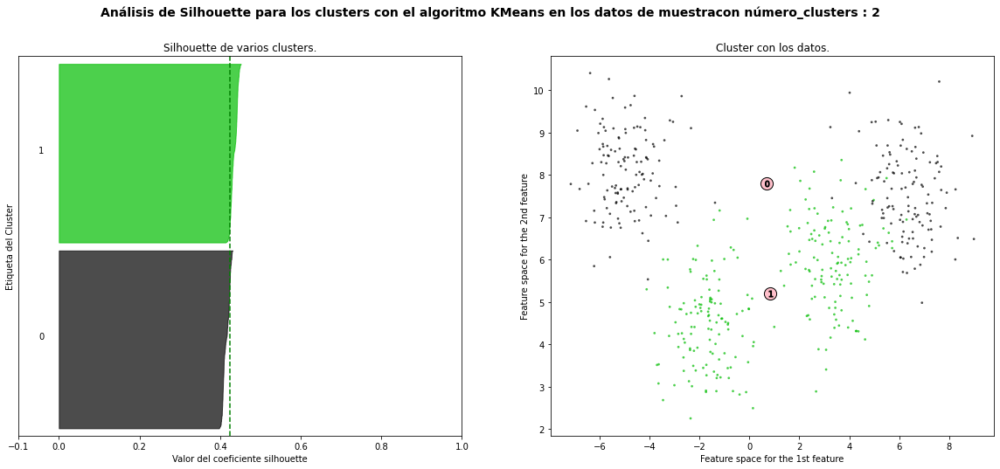

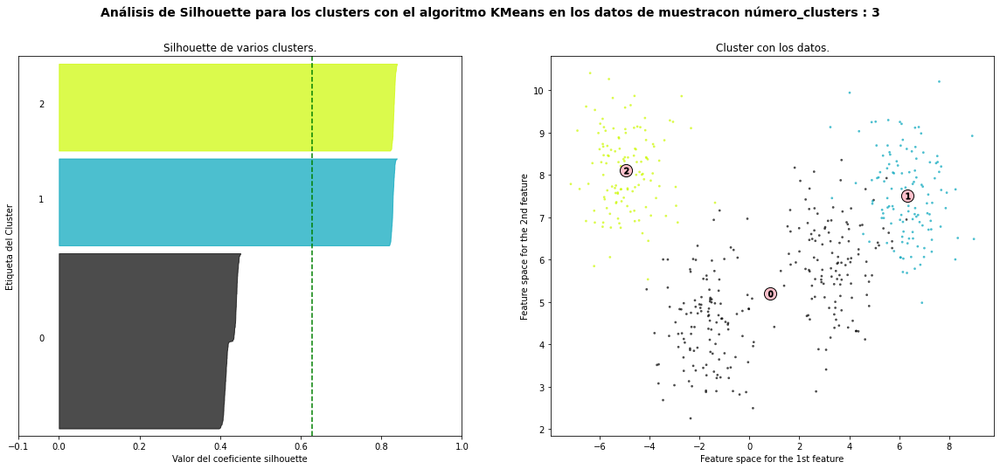

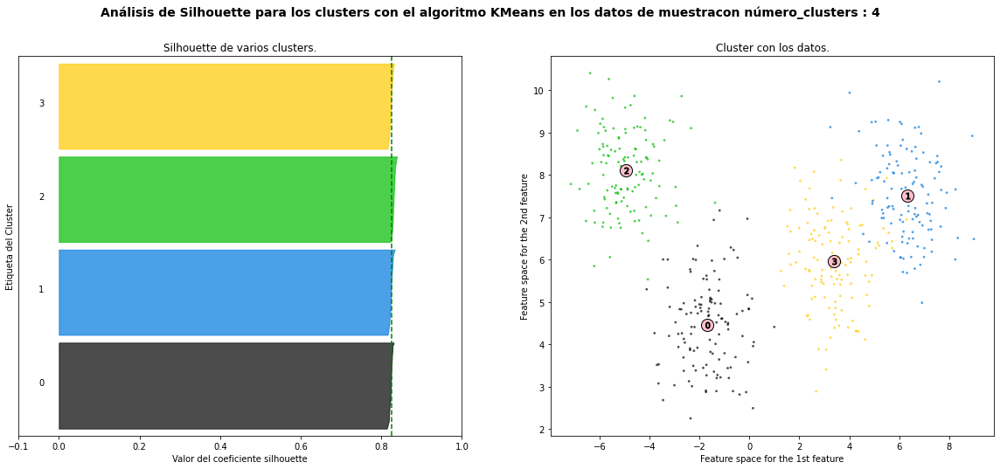

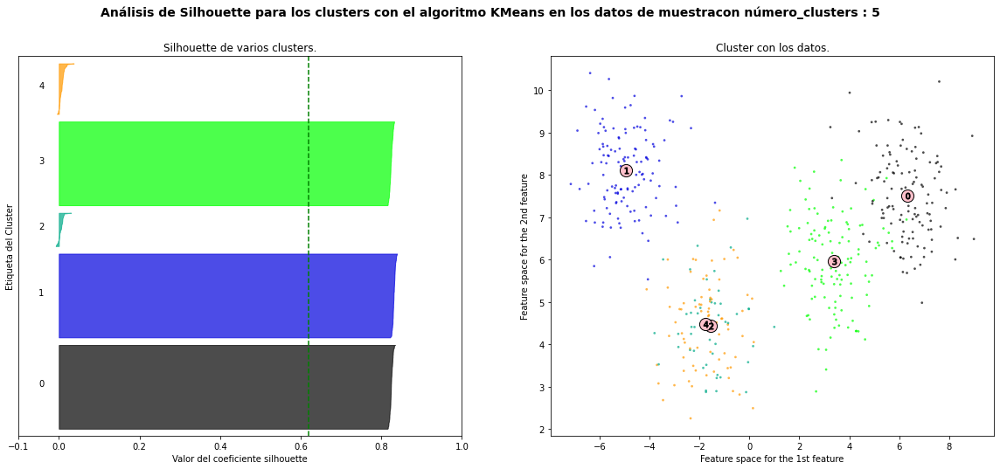

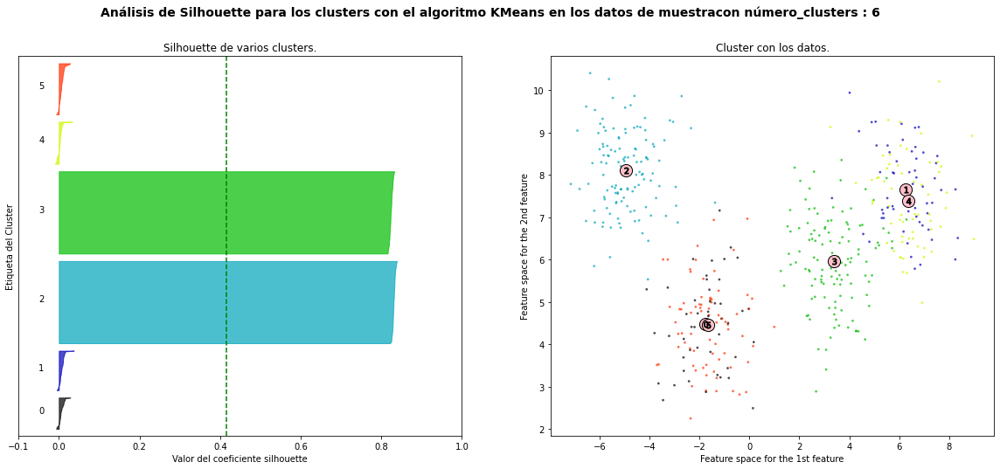

In [ ]:
print(__doc__)

X2, y = make_blobs(n_samples=489,
                  n_features=300,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1) 

rango_clusters = [2, 3, 4,5,6]

for n_clusters in rango_clusters:
    fig, (f1, f2) = plt.subplots(1, 2)
    fig.set_size_inches(20, 8)

    # El primero es de silhouette
    f1.set_xlim([-0.1, 1])
    # Se multiplica (n_clusters+1)*10 intersecar los espacio blancos entre silhouette
    f1.set_ylim([0, len(X2) + (n_clusters + 1) * 10])

    # hay un generador random para inicializar los n_clusters con una semilla de 10 para reproducibidad 
    cluster = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = cluster.fit_predict(X2)

    # El valor de silhouette_score da el promedio de todas las muestras, da una persectiva de la separacion que se forma en los clusters 
    silhouette_avg = silhouette_score(X2, cluster_labels)
    print("Para los clusters: ", n_clusters,
          "El promedio de silhouette_score es :", silhouette_avg)

    #Se calcula para cada muestra
    valor_sample_silhouette = silhouette_samples(X2, cluster_labels)

    y2 = 10
    for i in range(n_clusters):
       #agrega las muestras y se ordenan
        valor_cluster_silhouette = \
            valor_sample_silhouette[cluster_labels == i]
        valor_cluster_silhouette.sort()

        size_cluster = valor_cluster_silhouette.shape[0]
        y3 = y2 + size_cluster

        color = cm.nipy_spectral(float(i) / n_clusters)
        f1.fill_betweenx(np.arange(y2, y3),
                          0, valor_cluster_silhouette,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # etiquetas de silhouette con el numero del cluster en el medio
        f1.text(-0.05, y2 + 0.5 * size_cluster, str(i))

        #se calcula el nuevo valor para y2, con 10 por cada 0 muestras
        y2 = y3 + 10 

    f1.set_title("Silhouette de varios clusters.")
    f1.set_xlabel("Valor del coeficiente silhouette")
    f1.set_ylabel("Etiqueta del Cluster")

    # linea vertical que muesra el promedio de silhouette score con todos los valores
    f1.axvline(x=silhouette_avg, color="green", linestyle="--")

    f1.set_yticks([])  #limpia el eje x
    f1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Segundo grafico muestra los clusters formados
    color = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    f2.scatter(X2[:, 0], X2[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=color, edgecolor='k')

    #Etiquetado de los clusters
    centro = cluster.cluster_centers_
    #Dibuja un centro blanco en cada cluster
    f2.scatter(centro[:, 0], centro[:, 1], marker='o',
                c="pink", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centro):
        f2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    f2.set_title("Cluster con los datos.")
    f2.set_xlabel("Feature space for the 1st feature")
    f2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Análisis de Silhouette para los clusters con el algoritmo KMeans en los datos de muestra"
                  "con número_clusters : %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  after removing the cwd from sys.path.


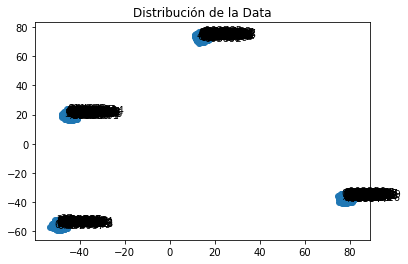

<Figure size 1440x1584 with 0 Axes>

In [ ]:
pca = PCA(n_components=2)
resultado = pca.fit_transform(X)
pyplot.scatter(resultado[:, 0], resultado[:, 1])
palabras = list(model_5.wv.vocab)
for i, palabra in enumerate(palabras):
	pyplot.annotate(palabra, xy=(resultado[i, 0], resultado[i, 1]))
pyplot.title('Distribución de la Data')
pyplot.figure(figsize=(20,22))
pyplot.show()

# **DEFINIENDO AUTOMATICAMENTE EL NUMERO DE CLUSTERS**

Encontrar la frecuencia de las palabras

In [5]:
pip install word2vec

     |████████████████████████████████| 42 kB 913 kB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for word2vec: filename=word2vec-0.11.1-py2.py3-none-any.whl size=156423 sha256=5bc56ec0442ab06c7349fb0d7f15f3472fb600b7509cd6738ab0cffe1341a035
  Stored in directory: /root/.cache/pip/wheels/c9/c0/d4/29d797817e268124a32b6cf8beb8b8fe87b86f099d5a049e61
Successfully built word2vec


In [ ]:
word2vec.word2clusters('drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_3.txt', 'clusters.txt', 10, verbose=True)

Running command: word2vec -train drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_3.txt -output clusters.txt -size 100 -window 5 -sample 1e-3 -hs 0 -negative 5 -threads 12 -iter 5 -min-count 5 -alpha 0.025 -debug 2 -binary 0 -cbow 1 -classes 10
Starting training using file drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec_3.txt
Vocab size: 620
Words in train file: 8249


In [ ]:
clusters = word2vec.load_clusters('clusters.txt')

In [ ]:
print(clusters.get_words_on_cluster(0).shape)
print(clusters.get_words_on_cluster(1).shape)

(65,)
(67,)


In [ ]:
clusters.get_words_on_cluster(8)[:10]

array(['quiero', 'semana', 'av', 'puente', 'tranvia_cuenca', 'agua',
       'hecho', '@lassoguillermo', '20', 'puedes'], dtype='<U23')

In [1]:
file = 'drive/MyDrive/DATA/tweetsNOStemmed_corpusReady_word2vec.txt'

try:
    with open(file) as f_obj:
        contents = f_obj.read()
        # print(contents)
except FileNotFoundError:
    msg = "El archivo " + file + " no existe"
    print( msg )
else:
    # Contar las palabras:
    words = contents.split()
    num_words = len( words )
    print("El archivo contiene: " + str( num_words))
    #leer de la lista
    print( words.count('correa'))
    print( words.count('corrupto'))
    print( words.count('lasso'))
    print( words.count('ecuador'))
    print( words.count('mashi'))

El archivo contiene: 2495288
1622
116
434
9564
138


[0.4303722365192531]
[0.4303722365192531, 0.628188090895389]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628, 0.41289101961014363]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628, 0.41289101961014363, 0.20779562687447078]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628, 0.41289101961014363, 0.20779562687447078, 0.20780470857395714]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628, 0.41289101961014363, 0.20779562687447078, 0.20780470857395714, 0.20762627627783845]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628, 0.41289101961014363, 0.20779562687447078, 0.20780470857395714, 0.20762627627783845, 0.20759371839518284]
[0.4303722365192531, 0.628188090895389, 0.8249350132383944, 0.619540852112628, 0.412891019

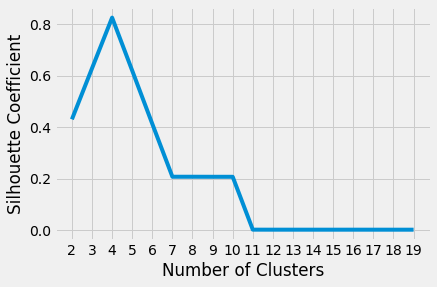

In [29]:
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(X)
    score = silhouette_score(X, kmeans.labels_)
    silhouette_coefficients.append(score)
    print(silhouette_coefficients)

plt.style.use("fivethirtyeight")
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [31]:
import numpy as np
from numpy.linalg import norm


class Kmeans:
    '''Implementing Kmeans algorithm.'''

    def __init__(self, n_clusters, max_iter=100, random_state=123):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state

    def initializ_centroids(self, X):
        np.random.RandomState(self.random_state)
        random_idx = np.random.permutation(X.shape[0])
        centroids = X[random_idx[:self.n_clusters]]
        return centroids

    def compute_centroids(self, X, labels):
        centroids = np.zeros((self.n_clusters, X.shape[1]))
        for k in range(self.n_clusters):
            centroids[k, :] = np.mean(X[labels == k, :], axis=0)
        return centroids

    def compute_distance(self, X, centroids):
        distance = np.zeros((X.shape[0], self.n_clusters))
        for k in range(self.n_clusters):
            row_norm = norm(X - centroids[k, :], axis=1)
            distance[:, k] = np.square(row_norm)
        return distance

    def find_closest_cluster(self, distance):
        return np.argmin(distance, axis=1)

    def compute_sse(self, X, labels, centroids):
        distance = np.zeros(X.shape[0])
        for k in range(self.n_clusters):
            distance[labels == k] = norm(X[labels == k] - centroids[k], axis=1)
        return np.sum(np.square(distance))
    
    def fit(self, X):
        self.centroids = self.initializ_centroids(X)
        for i in range(self.max_iter):
            old_centroids = self.centroids
            distance = self.compute_distance(X, old_centroids)
            self.labels = self.find_closest_cluster(distance)
            self.centroids = self.compute_centroids(X, self.labels)
            if np.all(old_centroids == self.centroids):
                break
        self.error = self.compute_sse(X, self.labels, self.centroids)
    
    def predict(self, X):
        distance = self.compute_distance(X, old_centroids)
        return self.find_closest_cluster(distance)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


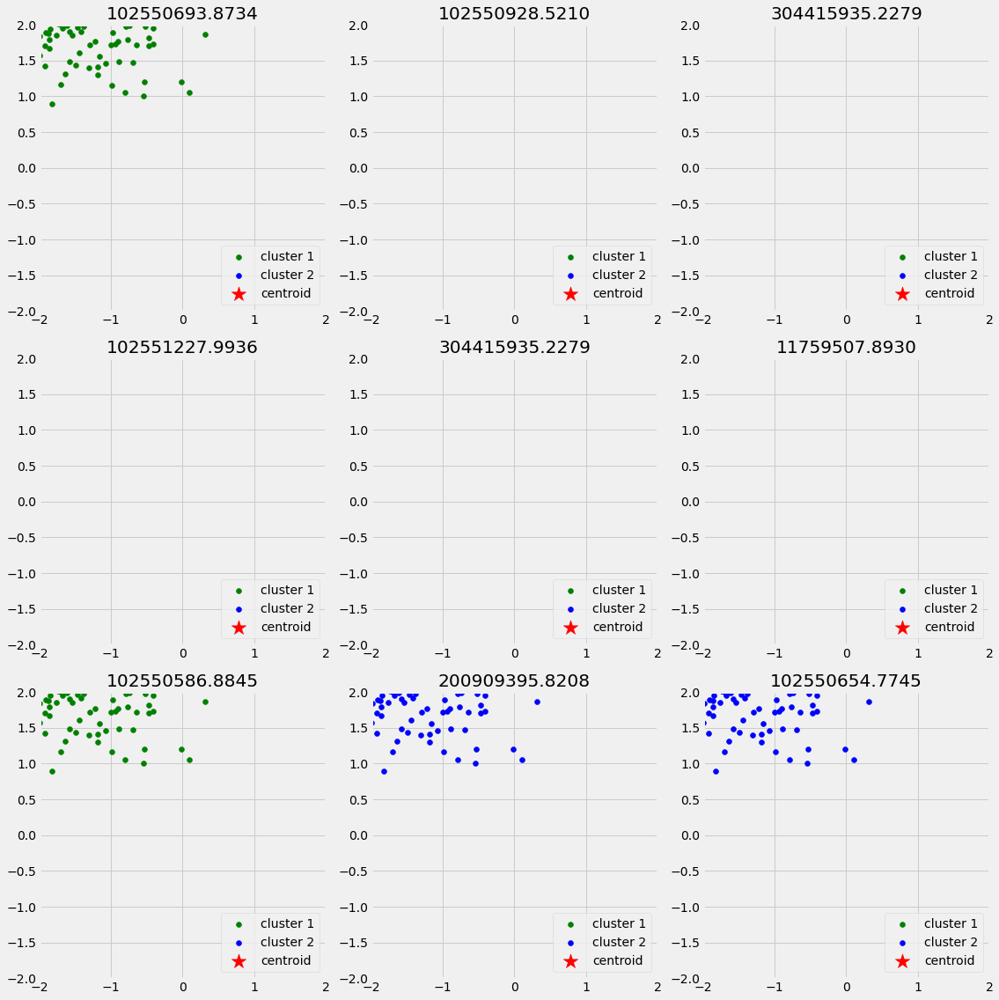

In [33]:
n_iter = 9
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax = np.ravel(ax)
centers = []
for i in range(n_iter):
    # Run local implementation of kmeans
    km = Kmeans(n_clusters=4,
                max_iter=3,
                random_state=np.random.randint(0, 1000, size=1))
    km.fit(X)
    centroids = km.centroids
    centers.append(centroids)
    ax[i].scatter(X[km.labels == 0, 0], X[km.labels == 0, 1],
                  c='green', label='cluster 1')
    ax[i].scatter(X[km.labels == 1, 0], X[km.labels == 1, 1],
                  c='blue', label='cluster 2')
    ax[i].scatter(centroids[:, 0], centroids[:, 1],
                  c='r', marker='*', s=300, label='centroid')
    ax[i].set_xlim([-2, 2])
    ax[i].set_ylim([-2, 2])
    ax[i].legend(loc='lower right')
    ax[i].set_title(f'{km.error:.4f}')
    ax[i].set_aspect('equal')
plt.tight_layout();